# Contrastive Language-Image Pre-training

This demo is based on the excellent tutorial [here](https://towardsdatascience.com/simple-implementation-of-openai-clip-model-a-tutorial-ace6ff01d9f2).

In this demo, we implement Contrastive Language-Image Pre-training (CLIP). At a high level, CLIP embeds images and text pairs to a small latent space. The goal is to make the embeddings of image and text pairs similar to each other. In this way, we want the embeddings to capture meaning which *transcends* the difference between language and images.

We achieve this goal by encouraging the embedded text and image pair to have high inner product while keeping the inner product of texts and images that are not pairs low.

CLIP has been an important component of the break through generative models including Stable Diffusion.

## Dependencies

We'll need a few dependencies to get started.

In [3]:
# !pip install timm
# !pip install transformers
# !pip install opencv-python
# !pip install pandas
# !pip install albumentations
# !pip install matplotlib

In [ ]:
import time
import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools
from tqdm.autonotebook import tqdm
import albumentations as A
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
import timm
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer
from transformers import AutoModel, AutoTokenizer, AutoConfig

I've been unable to load Flickr8 through pytorch. Instead, we'll use kaggle (we'll need to link a free account to the download).

In [5]:
!pip install kaggle --upgrade > /dev/null 2>&1
os.environ['KAGGLE_USERNAME'] = 'hurryingauto3'
os.environ['KAGGLE_KEY'] = '17e33c07cfd0993aecbc770b33c7054e'

### For Flickr 8k
!kaggle datasets download -d adityajn105/flickr8k > /dev/null 2>&1
!unzip flickr8k.zip > /dev/null 2>&1

In [6]:
os.environ['TOKENIZERS_PARALLELISM'] = 'false'

## Hyperparameters

We will use the following hyperparameters.

In [7]:
class config:
    debug = False
    image_path = "Images"
    captions_path = ""
    batch_size = 32
    num_workers = 2
    head_lr = 1e-3
    image_encoder_lr = 1e-4
    text_encoder_lr = 1e-5
    weight_decay = 1e-3
    patience = 1
    factor = 0.8
    epochs = 4
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model_name = 'resnet50'
    image_embedding = 2048
    text_encoder_model = "distilbert-base-uncased"
    text_embedding = 768
    text_tokenizer = "distilbert-base-uncased"
    max_length = 200

    pretrained = True # for both image encoder and text encoder
    trainable = True # for both image encoder and text encoder
    temperature = 1.0

    # image size
    size = 224

    # for projection head; used for both image and text encoders
    num_projection_layers = 1
    projection_dim = 256 
    dropout = 0.1

## Dataset

Whenever we work with text and images, we'll need to do a bit of tedious preprocessing. Here, we'll have to tokenize the sentence descriptions of images before passing them through an embedding and apply a transform to the images before loading them.

In [8]:
class CLIPDataset(torch.utils.data.Dataset):
    def __init__(self, image_filenames, captions, tokenizer, transforms):
        """
        image_filenames and cpations must have the same length; so, if there are
        multiple captions for each image, the image_filenames must have repetitive
        file names 
        """

        self.image_filenames = image_filenames
        self.captions = list(captions)
        self.encoded_captions = tokenizer(
            list(captions), padding=True, truncation=True, max_length=config.max_length
        )
        self.transforms = transforms

    def __getitem__(self, idx):
        item = {
            key: torch.tensor(values[idx])
            for key, values in self.encoded_captions.items()
        }

        image = cv2.imread(f"{config.image_path}/{self.image_filenames[idx]}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = self.transforms(image=image)['image']
        item['image'] = torch.tensor(image).permute(2, 0, 1).float()
        item['caption'] = self.captions[idx]

        return item


    def __len__(self):
        return len(self.captions)

## Embeddings

We'll need a way of encoding the images and text. For the images, we'll use a ResNet to get images down to a latent space of 2048. For the text, we'll use a Bert model to get images down to a latent space of 768.

Of course, to compare the embedded texts and images, they'll have to live in the same dimension. We can fix this by adding a projection head on top of the embeddings.

In [9]:
class ImageEncoder(nn.Module):
    """
    Encode images to a fixed size vector
    """

    def __init__(
        self, model_name=config.model_name, pretrained=config.pretrained, trainable=config.trainable
    ):
        super().__init__()
        self.model = timm.create_model(
            model_name, pretrained, num_classes=0, global_pool="avg"
        )
        for p in self.model.parameters():
            p.requires_grad = trainable

    def forward(self, x):
        return self.model(x)

    def get_embedding_dim(self):
        return self._embedding_dim

### TextEncoder
- Used AutoConfig, AutoModel to dynamically use different text encoders

In [10]:
class TextEncoder(nn.Module):
    """
    Encode text using a transformer model (like DistilBERT, BERT, RoBERTa).
    """
    def __init__(self, model_name=config.text_encoder_model, pretrained=config.pretrained, trainable=config.trainable):
        super().__init__()
        # Load model config
        config_transformer = AutoConfig.from_pretrained(model_name)
        # Load the specified pre-trained model
        if pretrained:
            self.model = AutoModel.from_pretrained(model_name, config=config_transformer)
        else:
            self.model = AutoModel.from_config(config_transformer)

        # Freeze or unfreeze model parameters
        for p in self.model.parameters():
            p.requires_grad = trainable

        # Determine the output embedding dimension
        self._embedding_dim = config_transformer.hidden_size

        # The index of the target token (e.g., CLS token is usually the first token, index 0)
        # This might need slight adjustment depending on the model/tokenizer, but 0 is standard for BERT/DistilBERT/RoBERTa
        self.target_token_idx = 0


    def forward(self, input_ids, attention_mask):
        output = self.model(input_ids=input_ids, attention_mask=attention_mask)
        # Get the hidden state of the target token (e.g., CLS token)
        last_hidden_state = output.last_hidden_state
        return last_hidden_state[:, self.target_token_idx, :]

In [11]:
class ProjectionHead(nn.Module):
    def __init__(
        self,
        embedding_dim,
        projection_dim=config.projection_dim,
        dropout=config.dropout
    ):
        super().__init__()
        self.projection = nn.Linear(embedding_dim, projection_dim)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(projection_dim, projection_dim)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(projection_dim)
    
    def forward(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x

## CLIP Architecture

Now we're ready to implement the CLIP architecture. As we discussed, we'll first have to embed the texts and images and apply the projection head to get embedded vectors in the same dimension.

Once we have the embedded vectors in hand, we'll compute the loss by taking the outer product of the embedded images with the embedded texts. This gives a Gram matrix where entry $(i,j)$ is the inner product between the $i$th text embedding and $j$th image embedding. If we didn't have text or image duplicates, we'd want this matrix to be as close to the identity as possible: entry $(i,i)$ is the inner product between the $i$th image and text pair which we want to be large while entry $(i,j)$ (for $i\neq j$) should be small.

We can encourage this by making our loss the cross entropy loss between the identity matrix and our gram matrix.
The picture gets a little bit more complicated when we have duplicates (each image has five different captions). We can deal with this by replacing the identity matrix with a matrix encoding whether different texts (images) are the same.

- Added text encoder and image encoder models to CLIP init function

In [12]:
class CLIPModel(nn.Module):
    def __init__(
        self,
        image_model_name=config.model_name,
        text_model_name=config.text_encoder_model,
        image_embedding=config.image_embedding,
        text_embedding=config.text_embedding,
        temperature=config.temperature,
        
    ):
        super().__init__()

        # Passed model names  
        self.image_encoder = ImageEncoder(model_name=image_model_name)
        self.text_encoder = TextEncoder(model_name=text_model_name)
        
        self.image_projection = ProjectionHead(embedding_dim=image_embedding)
        self.text_projection = ProjectionHead(embedding_dim=text_embedding)
        
        self.temperature = temperature

    def forward(self, batch):
        # Getting Image and Text Features
        image_features = self.image_encoder(batch["image"])
        text_features = self.text_encoder(
            input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
        )
        # Getting Image and Text Embeddings (with same dimension)
        image_embeddings = self.image_projection(image_features)
        text_embeddings = self.text_projection(text_features)

        # Calculating the Loss
        batch_size = len(image_embeddings) 
        logits = (text_embeddings @ image_embeddings.T) / self.temperature
        images_similarity = image_embeddings @ image_embeddings.T
        texts_similarity = text_embeddings @ text_embeddings.T
        targets = F.softmax(
            (images_similarity + texts_similarity) / 2 * self.temperature, dim=-1
        )
        texts_loss = cross_entropy(logits, targets, reduction='none')
        images_loss = cross_entropy(logits.T, targets.T, reduction='none')
        loss =  (images_loss + texts_loss) / 2.0 # shape: (batch_size)
        return loss.mean()


def cross_entropy(preds, targets, reduction='none'):
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)
    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

Here's an example of what we're doing to get the target matrices.

In [13]:
batch_size = 4
dim = 128
embeddings = torch.randn(batch_size, dim)
out = embeddings @ embeddings.T
print(out)
print(F.softmax(out, dim=-1))

tensor([[125.2701,   9.4301,  -1.1540, -19.7471],
        [  9.4301, 128.5327, -25.2864, -19.8102],
        [ -1.1540, -25.2864, 130.1016,  19.8630],
        [-19.7471, -19.8102,  19.8630, 130.5588]])
tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.]])


# Training

Here are some helper functions to load the training and validation dataloaders.

In [14]:
def make_train_valid_dfs():
    dataframe = pd.read_csv(f"{config.captions_path}captions.csv")
    max_id = dataframe["id"].max() + 1 if not config.debug else 100
    image_ids = np.arange(0, max_id)
    np.random.seed(42)
    valid_ids = np.random.choice(
        image_ids, size=int(0.2 * len(image_ids)), replace=False
    )
    train_ids = [id_ for id_ in image_ids if id_ not in valid_ids]
    train_dataframe = dataframe[dataframe["id"].isin(train_ids)].reset_index(drop=True)
    valid_dataframe = dataframe[dataframe["id"].isin(valid_ids)].reset_index(drop=True)
    return train_dataframe, valid_dataframe


def build_loaders(dataframe, tokenizer, mode):
    transforms = A.Compose(
        [
            A.Resize(config.size, config.size),
            A.Normalize(max_pixel_value=255.0),
        ]
    )
    dataset = CLIPDataset(
        dataframe["image"].values,
        dataframe["caption"].values,
        tokenizer=tokenizer,
        transforms=transforms,
    )
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=config.batch_size,
        num_workers=config.num_workers,
        shuffle=True if mode == "train" else False,
    )
    return dataloader

class AvgMeter:
    def __init__(self, name="Metric"):
        self.name = name
        self.reset()

    def reset(self):
        self.avg, self.sum, self.count = [0] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += val * count
        self.avg = self.sum / self.count

    def __repr__(self):
        text = f"{self.name}: {self.avg:.4f}"
        return text

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group["lr"]

Here are the standard evaluation and training functions we are by now very familiar with.

In [15]:
def train_epoch(model, train_loader, optimizer, lr_scheduler, step):
    loss_meter = AvgMeter()
    tqdm_object = tqdm(train_loader, total=len(train_loader))
    for batch in tqdm_object:
        batch = {k: v.to(config.device) for k, v in batch.items() if k != "caption"}
        loss = model(batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if step == "batch":
            lr_scheduler.step()

        count = batch["image"].size(0)
        loss_meter.update(loss.item(), count)

        tqdm_object.set_postfix(train_loss=loss_meter.avg, lr=get_lr(optimizer))
    return loss_meter

def valid_epoch(model, valid_loader):
    loss_meter = AvgMeter()
    tqdm_object = tqdm(valid_loader, total=len(valid_loader))
    for batch in tqdm_object:
        batch = {k: v.to(config.device) for k, v in batch.items() if k != "caption"}
        loss = model(batch)

        count = batch["image"].size(0)
        loss_meter.update(loss.item(), count)

        tqdm_object.set_postfix(valid_loss=loss_meter.avg)
    return loss_meter

Now let's load the dataset into a dataframe.

In [16]:
df = pd.read_csv(f"{config.captions_path}captions.txt")
df['id'] = [id_ for id_ in range(df.shape[0] // 5) for _ in range(5)]
df.to_csv(f"{config.captions_path}captions.csv", index=False)
df = pd.read_csv("captions.csv")
df.head()

,image,caption,id
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,0
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,0
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,0
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,0


Finally, we'll initialize dataloaders, model, parameter, optimizer, and scheduler. With all this in hand, we can train. Each epoch takes about 9 minutes on the GPU.

- Added train_clip_model() function to initialize CLIP model using varying encoder combinations
- Combined model initilization and model training

In [17]:
def train_clip_model(image_model_name, text_model_name, image_embedding, text_embedding, model_save_path, epochs=config.epochs):
    """Trains a CLIP model with specified encoder backbones."""

    print(f"\n--- Training Model: Image={image_model_name}, Text={text_model_name} ---")
    print(f"Saving best model to: {model_save_path}")

    # --- Data Loaders ---
    tokenizer = AutoTokenizer.from_pretrained(text_model_name)
    train_df, valid_df = make_train_valid_dfs()
    train_loader = build_loaders(train_df, tokenizer, mode="train")
    valid_loader = build_loaders(valid_df, tokenizer, mode="valid")
    print(f"Train dataset size: {len(train_df)}, Valid dataset size: {len(valid_df)}")


    # --- Model ---
    model = CLIPModel(
        image_model_name=image_model_name,
        text_model_name=text_model_name,
        image_embedding=image_embedding,
        text_embedding=text_embedding, 
        temperature=config.temperature
    ).to(config.device)
    print("Model built.")

    # --- Optimizers ---
    params = [
        {"params": model.image_encoder.parameters(), "lr": config.image_encoder_lr},
        {"params": model.text_encoder.parameters(), "lr": config.text_encoder_lr},
        {"params": itertools.chain(
            model.image_projection.parameters(), model.text_projection.parameters()
        ), "lr": config.head_lr, "weight_decay": config.weight_decay}
    ]
    optimizer = torch.optim.AdamW(params, weight_decay=0.) # Use weight_decay from config where needed
    print("Optimizer configured.")

    # --- Scheduler ---
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", patience=config.patience, factor=config.factor
    )
    step = "epoch" # Schedule LR based on epoch validation loss

    # --- Training Loop ---
    best_loss = float('inf')

    for epoch in range(epochs):
        start_time = time.time()
        # Train
        model.train()
        train_loss_meter = train_epoch(model, train_loader, optimizer, lr_scheduler if step == "batch" else None, step)

        # Validate
        model.eval()
        with torch.no_grad():
            valid_loss_meter = valid_epoch(model, valid_loader)

        print(f"Epoch {epoch + 1}/{epochs} | Train Loss: {train_loss_meter.avg:.4f} \
        | Valid Loss: {valid_loss_meter.avg:.4f} | Time: {time.time()-start_time:.2f} sec")

        # Save best model based on validation loss
        if valid_loss_meter.avg < best_loss:
            best_loss = valid_loss_meter.avg
            torch.save(model.state_dict(), model_save_path)
            print(f"Saved Best Model to {model_save_path}!")

        # Step scheduler
        if step == "epoch":
            lr_scheduler.step(valid_loss_meter.avg)


    print(f"--- Training finished for {image_model_name}+{text_model_name} ---")
    del model, optimizer, lr_scheduler, train_loader, valid_loader
    gc.collect()
    torch.cuda.empty_cache() # Clear GPU memory

In [18]:
model_configurations = [
    ("resnet18", "distilbert-base-uncased", 512, 768, "rn18_distilbert_best.pt"),
    ("resnet34", "bert-base-uncased",       512, 768, "rn34_bert_best.pt"),
    ("resnet50", "roberta-base",           2048, 768, "rn50_roberta_best.pt"),
]

## resnet18 + distilbert-base-uncased

In [19]:
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[0]
train_clip_model(img_name, text_name, image_embedding, text_embedding, save_path, epochs=config.epochs)


--- Training Model: Image=resnet18, Text=distilbert-base-uncased ---
Saving best model to: rn18_distilbert_best.pt


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Train dataset size: 32365, Valid dataset size: 8090


model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Model built.
Optimizer configured.


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 1/4 | Train Loss: 2.4459         | Valid Loss: 2.2457 | Time: 177.19 sec
Saved Best Model to rn18_distilbert_best.pt!


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 2/4 | Train Loss: 0.9416         | Valid Loss: 2.1889 | Time: 174.15 sec
Saved Best Model to rn18_distilbert_best.pt!


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 3/4 | Train Loss: 0.5743         | Valid Loss: 2.2394 | Time: 175.05 sec


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 4/4 | Train Loss: 0.3804         | Valid Loss: 2.2726 | Time: 175.97 sec
--- Training finished for resnet18+distilbert-base-uncased ---


## resnet34 + bert-base-uncased

In [20]:
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[1]
train_clip_model(img_name, text_name, image_embedding, text_embedding, save_path, epochs=config.epochs)


--- Training Model: Image=resnet34, Text=bert-base-uncased ---
Saving best model to: rn34_bert_best.pt


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Train dataset size: 32365, Valid dataset size: 8090


model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Model built.
Optimizer configured.


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 1/4 | Train Loss: 2.6875         | Valid Loss: 2.1856 | Time: 269.59 sec
Saved Best Model to rn34_bert_best.pt!


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 2/4 | Train Loss: 0.8855         | Valid Loss: 2.1555 | Time: 269.85 sec
Saved Best Model to rn34_bert_best.pt!


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 3/4 | Train Loss: 0.4842         | Valid Loss: 2.1827 | Time: 270.96 sec


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 4/4 | Train Loss: 0.3300         | Valid Loss: 2.2363 | Time: 271.50 sec
--- Training finished for resnet34+bert-base-uncased ---


## resnet50 + roberta-base

In [21]:
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[2]
train_clip_model(img_name, text_name, image_embedding, text_embedding, save_path, epochs=config.epochs)


--- Training Model: Image=resnet50, Text=roberta-base ---
Saving best model to: rn50_roberta_best.pt


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Train dataset size: 32365, Valid dataset size: 8090


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model built.
Optimizer configured.


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 1/4 | Train Loss: 1.9673         | Valid Loss: 2.1302 | Time: 356.39 sec
Saved Best Model to rn50_roberta_best.pt!


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 2/4 | Train Loss: 0.5912         | Valid Loss: 2.1399 | Time: 355.99 sec


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 3/4 | Train Loss: 0.3519         | Valid Loss: 2.1513 | Time: 355.25 sec


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Epoch 4/4 | Train Loss: 0.2360         | Valid Loss: 2.2870 | Time: 355.19 sec
--- Training finished for resnet50+roberta-base ---


# Evaluation

We will test our model by providing it a text and asking for images that are close to it. We'll start by embedding all our images and loading the model.

- get_image_embeddings() loads the text encoder dynamically using the CLIP model configurations and model path
- find_matches() loads the loaded model, embeddings, queries, and the encoder model name to produce a len(queries)x9 grid of unique predictions 

In [22]:
def get_image_embeddings(valid_df, 
                         img_name, 
                         text_name, 
                         image_embedding, 
                         text_embedding, 
                         model_path):
    
    tokenizer = AutoTokenizer.from_pretrained(text_name)
    valid_loader = build_loaders(valid_df, tokenizer, mode="valid")
    
    model = CLIPModel(img_name, text_name, image_embedding, text_embedding).to(config.device)
    model.load_state_dict(torch.load(model_path, map_location=config.device))
    model.eval()
    
    valid_image_embeddings = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            image_features = model.image_encoder(batch["image"].to(config.device))
            image_embeddings = model.image_projection(image_features)
            valid_image_embeddings.append(image_embeddings)
    return model, torch.cat(valid_image_embeddings)

In [46]:
def find_matches(model, image_embeddings, queries, image_filenames, n=9, text_model_name=config.text_encoder_model):
    """
    Finds and displays the top N images matching each text query in a list of queries.
    Displays results in a grid where each row corresponds to a query.

    Args:
        model (CLIPModel): The trained CLIP model.
        image_embeddings (torch.Tensor): Pre-computed embeddings for the validation images.
        queries (list[str]): A list of text query strings.
        image_filenames (np.ndarray): Array of image filenames corresponding to image_embeddings.
        n (int): The number of top matches to display for each query (determines number of columns).
        text_model_name (str): The name of the text encoder model used during training
                                (needed to load the correct tokenizer).
    """
    # Load the correct tokenizer based on the text model name
    tokenizer = AutoTokenizer.from_pretrained(text_model_name)

    # Determine the number of queries and the number of matches per query (n)
    num_queries = len(queries)
    num_matches_per_query = n # Number of columns in the plot grid

    # Prepare the figure and axes for plotting
    # Grid will be num_queries rows x n columns
    _, axes = plt.subplots(num_queries, num_matches_per_query, figsize=(2 * num_matches_per_query, 2 * num_queries))
    # Ensure axes is a 2D array even if num_queries or n is 1
    if num_queries == 1:
        axes = np.expand_dims(axes, axis=0)
    if num_matches_per_query == 1:
         axes = np.expand_dims(axes, axis=1)


    # Get the image IDs for the validation set (needed to find unique images)
    _, valid_df_test_final = make_train_valid_dfs() # Re-read if needed, ensure consistency
    valid_image_ids = valid_df_test_final['id'].values


    # Loop through each query in the list
    for i, query in enumerate(queries):
        print(f"Processing query: '{query}'")

        # Encode the current text query
        encoded_query = tokenizer(
            [query],
            padding=True,
            truncation=True,
            max_length=config.max_length,
            return_tensors="pt"
        )

        # Move the tokenized query batch to the specified device
        batch = {
            key: values.to(config.device)
            for key, values in encoded_query.items()
        }

        # Get the text embedding for the query
        with torch.no_grad():
            text_features = model.text_encoder(
                input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
            )
            text_embeddings = model.text_projection(text_features)

        # Normalize embeddings for similarity calculation
        # Move image_embeddings to the device for calculation
        image_embeddings_n = F.normalize(image_embeddings.to(config.device), p=2, dim=-1)
        text_embeddings_n = F.normalize(text_embeddings, p=2, dim=-1)

        # Calculate the dot similarity
        dot_similarity = text_embeddings_n @ image_embeddings_n.T

        # Get the indices of the top N*5 most similar images
        values, indices_flat = torch.topk(dot_similarity.squeeze(0), n * 5) # Get more than n to find unique IDs

        # Find the top N unique image filenames from the ranked indices
        matched_image_filenames_unique = []
        seen_ids = set()
        for idx in indices_flat.cpu().numpy():
            image_id = valid_image_ids[idx]
            if image_id not in seen_ids and len(matched_image_filenames_unique) < n:
                seen_ids.add(image_id)
                matched_image_filenames_unique.append(valid_df_test_final['image'].iloc[idx])
                if len(matched_image_filenames_unique) >= n:
                    break

        # Display the results for the current query in the i-th row of the grid
        for j, match_filename in enumerate(matched_image_filenames_unique):
            if j >= num_matches_per_query: break # Safety break

            ax = axes[i, j] # Select the correct subplot (row i, column j)

            # Read and convert the image
            image = cv2.imread(f"{config.image_path}/{match_filename}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert BGR to RGB

            # Display the image
            ax.imshow(image)
            ax.axis("off") # Turn off axes

        # Add the query text as a title for the row or the first image in the row
        axes[i, 0].set_title(f"Query: '{query}'", fontsize=10, pad=5, loc='left') # Title above the first image in the row

         # Hide any unused subplots in this row if fewer than n unique matches were found
        for j in range(len(matched_image_filenames_unique), num_matches_per_query):
             axes[i, j].axis("off")


    output_path = f"results_{text_model_name}.png"
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()



## resnet18 + distilbert-base-uncased

In [47]:
queries = ["two friends playing basketball", 
        "a boy jumping with skateboard",
        "a dog running in the grass",
        "a person riding a bike",
        "children playing outside",
        "a woman in a boat",
        "a group of people smiling",
          ]

In [48]:
_, valid_df = make_train_valid_dfs()
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[0]
model, image_embeddings = get_image_embeddings(valid_df, img_name, text_name, image_embedding, text_embedding, save_path)

/tmp/ipykernel_31/3640193842.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=config.device))


  0%|          | 0/253 [00:00<?, ?it/s]

Processing query: 'two friends playing basketball'
Processing query: 'a boy jumping with skateboard'
Processing query: 'a dog running in the grass'
Processing query: 'a person riding a bike'
Processing query: 'children playing outside'
Processing query: 'a woman in a boat'
Processing query: 'a group of people smiling'


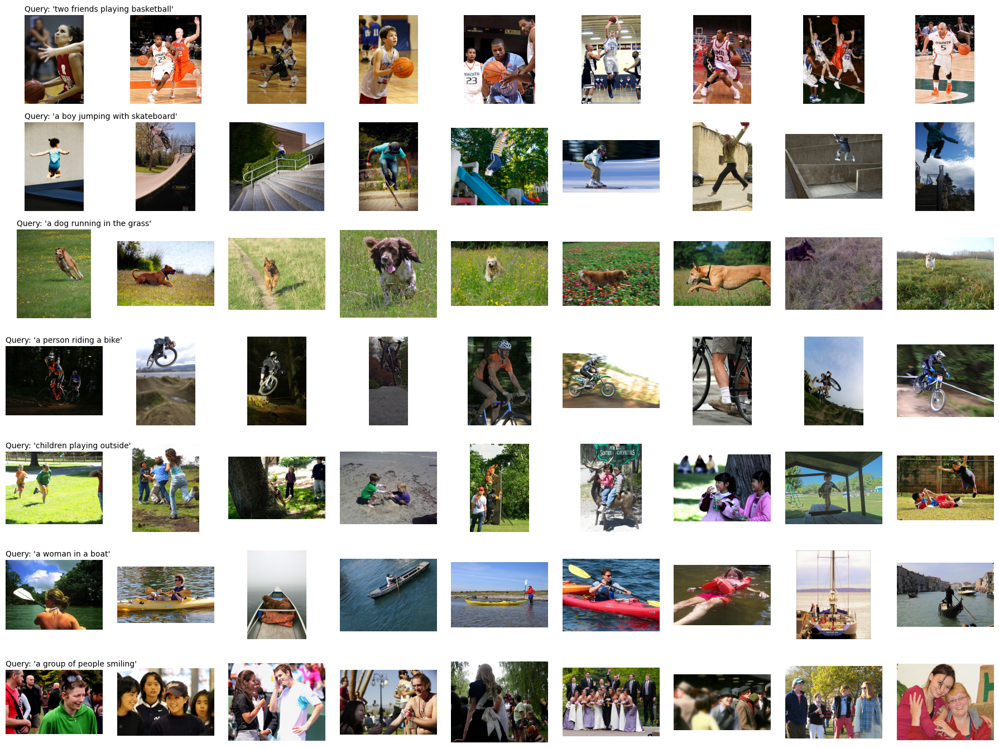

In [49]:
find_matches(model, 
             image_embeddings,
             queries=queries,
             image_filenames=valid_df['image'].values,
             n=9,
             text_model_name=text_name
            )

## resnet34 + bert-base-uncased

In [50]:
_, valid_df = make_train_valid_dfs()
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[1]
model, image_embeddings = get_image_embeddings(valid_df, img_name, text_name, image_embedding, text_embedding, save_path)

/tmp/ipykernel_31/3640193842.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=config.device))


  0%|          | 0/253 [00:00<?, ?it/s]

Processing query: 'two friends playing basketball'
Processing query: 'a boy jumping with skateboard'
Processing query: 'a dog running in the grass'
Processing query: 'a person riding a bike'
Processing query: 'children playing outside'
Processing query: 'a woman in a boat'
Processing query: 'a group of people smiling'


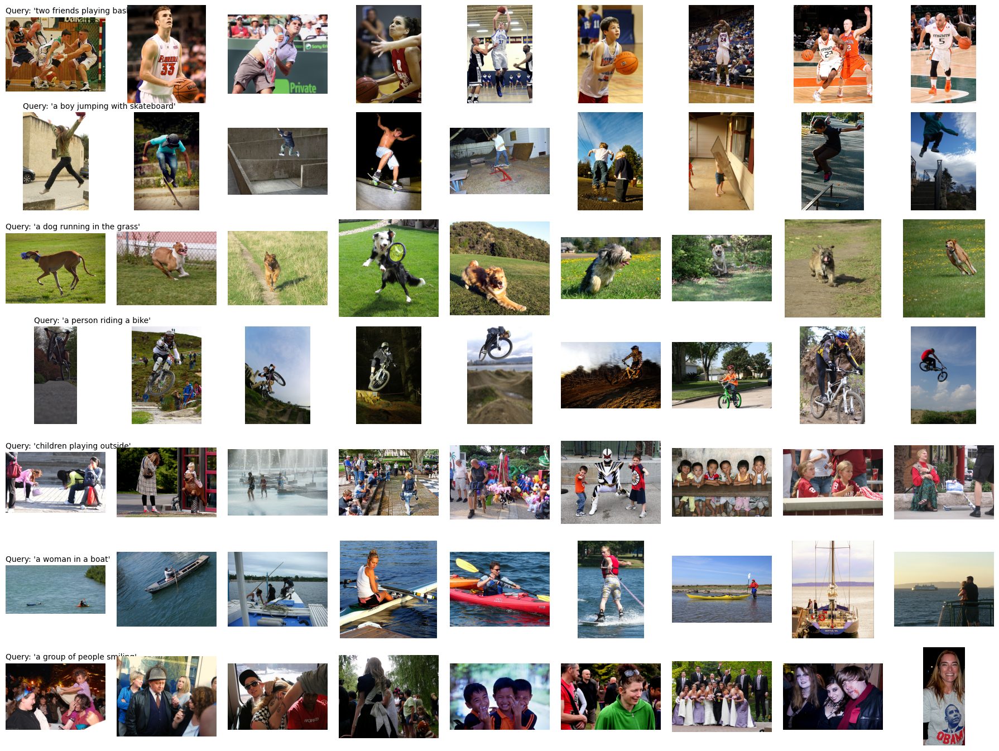

In [51]:
find_matches(model, 
             image_embeddings,
             queries=queries,
             image_filenames=valid_df['image'].values,
             n=9,
             text_model_name=text_name
            )

## resnet50 + roberta-base

In [52]:
_, valid_df = make_train_valid_dfs()
img_name, text_name, image_embedding, text_embedding, save_path = model_configurations[2]
model, image_embeddings = get_image_embeddings(valid_df, img_name, text_name, image_embedding, text_embedding, save_path)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_31/3640193842.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start s

  0%|          | 0/253 [00:00<?, ?it/s]

Processing query: 'two friends playing basketball'
Processing query: 'a boy jumping with skateboard'
Processing query: 'a dog running in the grass'
Processing query: 'a person riding a bike'
Processing query: 'children playing outside'
Processing query: 'a woman in a boat'
Processing query: 'a group of people smiling'


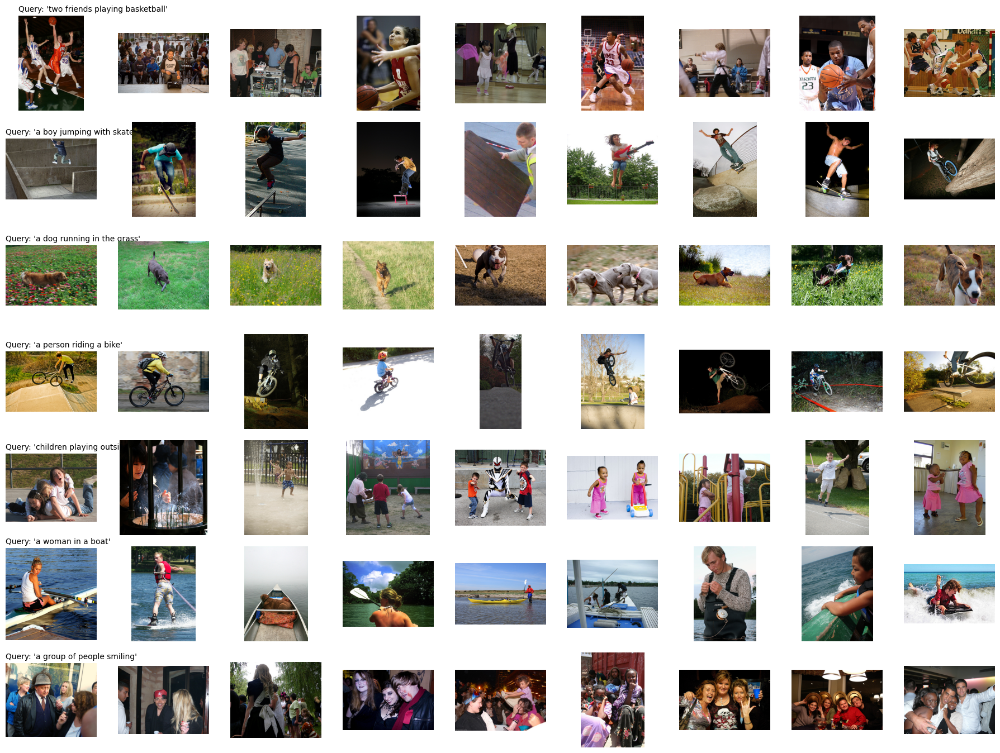

In [53]:
find_matches(model, 
             image_embeddings,
             queries=queries,
             image_filenames=valid_df['image'].values,
             n=9,
             text_model_name=text_name
            )